In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [3]:
import numpy as np
import timm
import matplotlib.pyplot as plt
import torch
import torchvision.transforms.functional as F
from robustbench.data import load_clean_dataset
from robustbench.loaders import CustomImageFolder
from robustbench.model_zoo.enums import BenchmarkDataset
from torch import nn
from torch.utils import data
from torchvision import transforms
from torchvision.utils import make_grid

import attacks
import utils

In [4]:
plt.rcParams["savefig.bbox"] = 'tight'
device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")

In [5]:
# Set up model
CHECKPOINTS_DIR = "../checkpoints"
checkpoint_file = "xcit-imagenet-4.pth.tar"
model_name = "xcit_small_12_p16_224"
model = timm.create_model(model_name, checkpoint_path=os.path.join(CHECKPOINTS_DIR, checkpoint_file))
model = model.to(device)

In [6]:
# Set up data
torch.manual_seed(0)
data_dir = "~/imagenet/"
dataset = BenchmarkDataset.imagenet
preprocessing = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor()
    ])
n_examples = 16
imagenet = CustomImageFolder(data_dir + '/val', preprocessing)
test_loader = data.DataLoader(imagenet,
                              batch_size=n_examples,
                              shuffle=True,
                              num_workers=4)
x, y, _ = next(iter(test_loader))
x, y = x.to(device), y.to(device)

x.shape, y.shape

(torch.Size([16, 3, 224, 224]), torch.Size([16]))

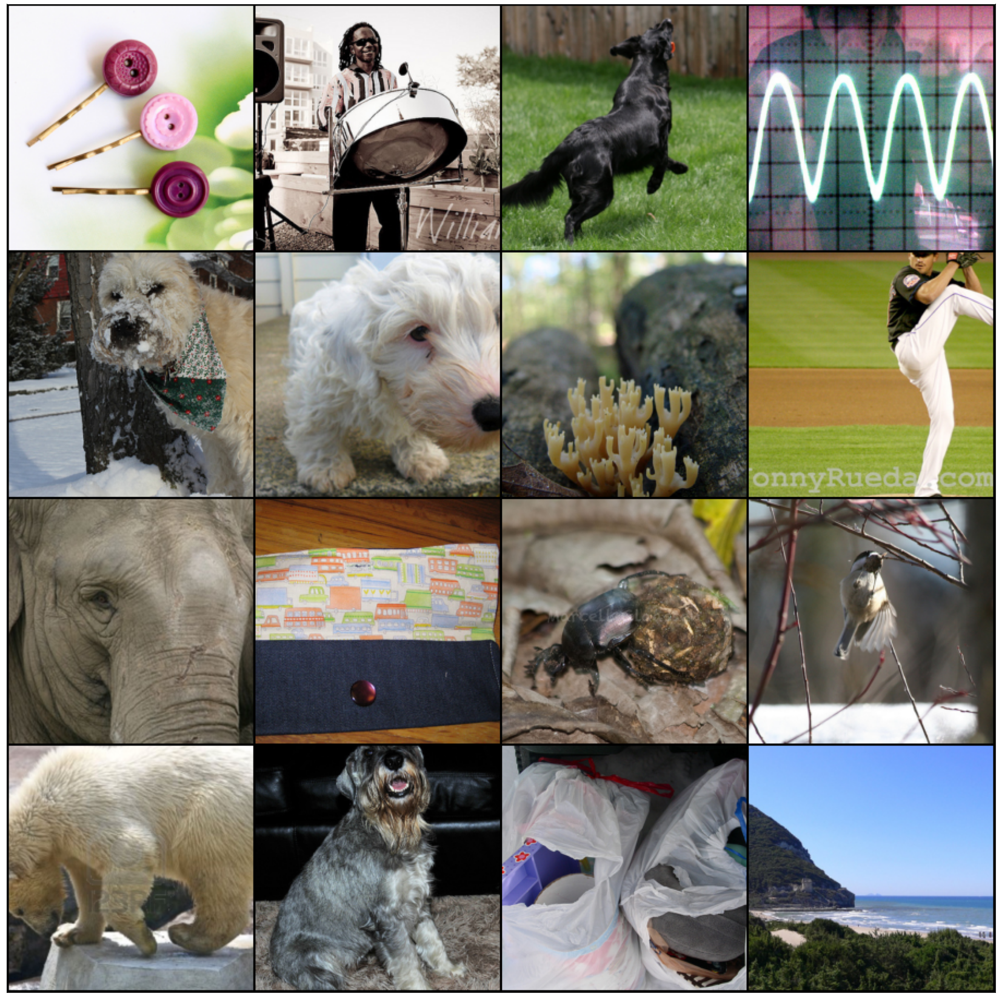

In [7]:
# Plot original images
def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
    fix, axs = plt.subplots(ncols=len(imgs), squeeze=False, figsize=(30, 30))
    for i, img in enumerate(imgs):
        img = img.detach()
        img = F.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

grid = make_grid(x, nrow=4)
show(grid)

In [8]:
# Set up attack
attack = "pgd"
eps = 4 / 255
steps = 100
lr = 1.5 * eps / steps
norm = "linf"
boundaries = 0, 1

attack_criterion = nn.NLLLoss(reduction="sum")
attack = attacks.make_attack(attack,
                             eps,
                             lr,
                             steps,
                             norm,
                             boundaries,
                             attack_criterion)

In [9]:
adv_x = attack(model.to(device), x.to(device), y.to(device))

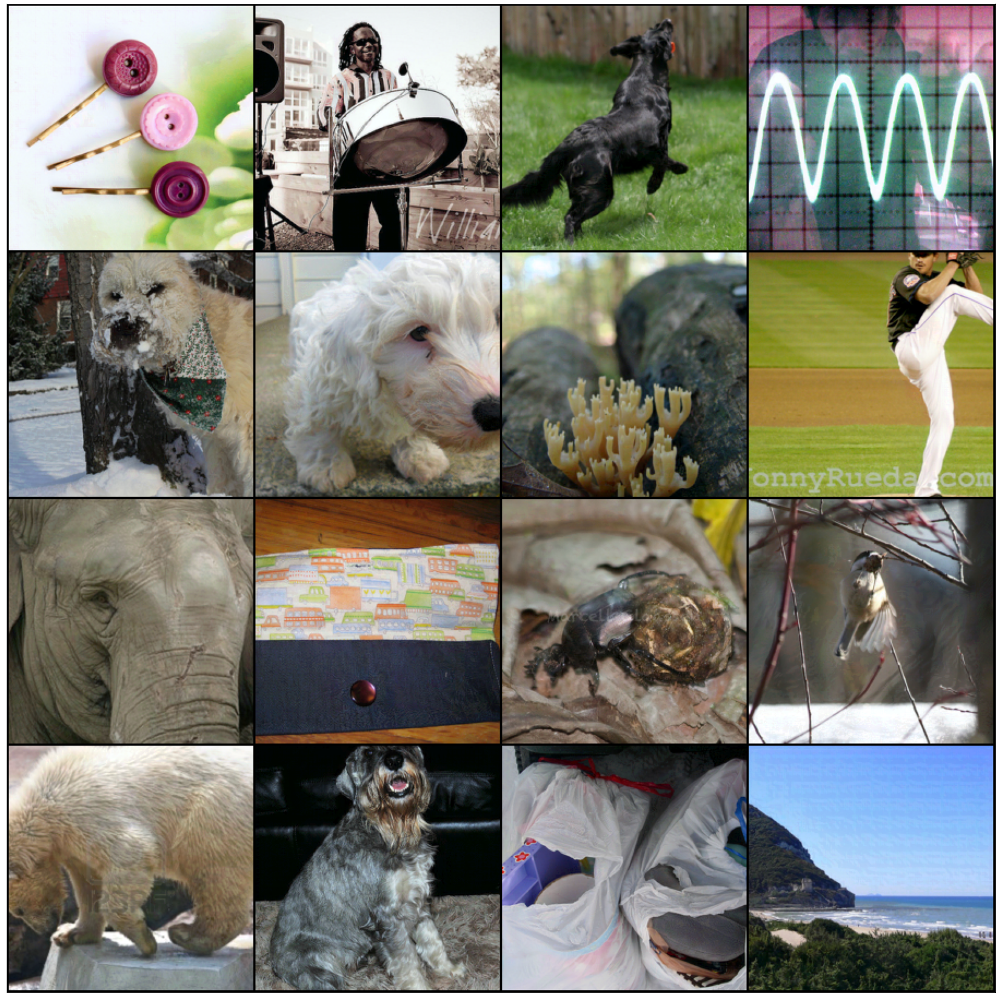

In [10]:
adv_grid = make_grid(adv_x, nrow=4)
show(adv_grid)

In [11]:
torch.linalg.norm(x - adv_x, ord=np.inf, dim=0).max(), eps

(tensor(0.0157, device='cuda:0'), 0.01568627450980392)

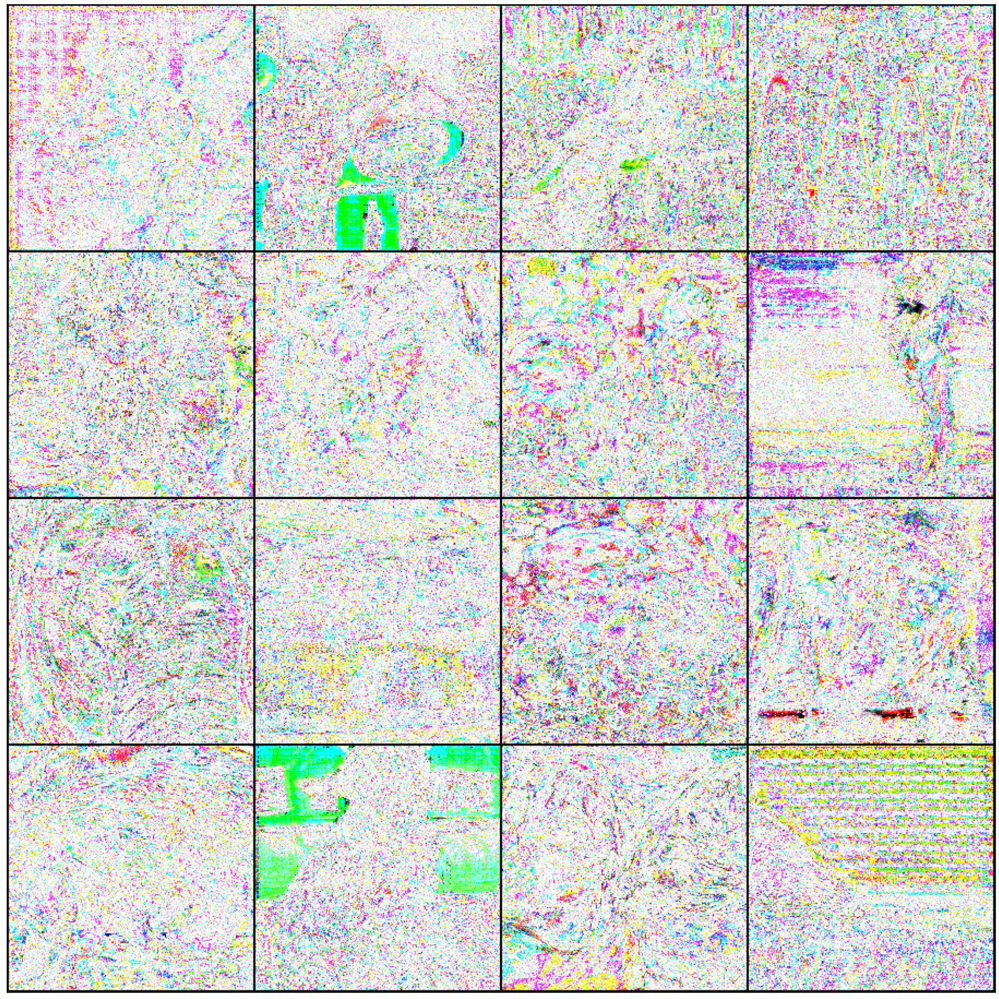

In [12]:
perts = torch.abs(adv_x - x)
perts = perts / perts.max()
perts_grid = make_grid(perts, nrow=4)
show(perts_grid)